In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import sys
sys.path.append("../src/geotransformer/experiments/lomatch")
sys.path.append("../")

import torch
print(torch.cuda.is_available())
from util.data import PairBreakingBadDataset
from config import make_cfg
from dataset import train_valid_data_loader

torch.multiprocessing.set_start_method('spawn')

import jhutil
import yaml
import torch
torch.manual_seed(1234)
from jhutil import show_meshes

True


In [2]:
%matplotlib widget

In [3]:
from multi_part_assembly.datasets.geometry_data import build_geometry_dataset, build_geometry_dataloader
from multi_part_assembly.datasets.geometry_data import GeometryPartDataset as BreakingBadDataset

import jhutil
import torch
from torch.utils.data import Dataset, DataLoader
import torch
from jhutil import show_meshes, show_point_clouds

In [4]:
cfg = jhutil.load_yaml("../yamls/data_example.yaml")
cfg.data.overfit = 5
train_data, val_data = build_geometry_dataset(cfg)

init done
init done


In [5]:
len(train_data)

5

In [6]:
data = train_data[0]
data

/data/wlsgur4011/part_assembly/src/multi-part-assembly/multi_part_assembly/datasets/geometry_data.py:167: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1640811806235/work/torch/csrc/utils/tensor_numpy.cpp:189.)
  area_faces = torch.Tensor(src_mesh.area_faces)


{'pcs': None,
 'broken_pcs': [tensor[24933, 3] n=74799 (0.3Mb) x∈[-1.599, 1.463] μ=4.710e-08 σ=0.523,
  tensor[10924, 3] n=32772 (0.1Mb) x∈[-1.202, 1.224] μ=1.001e-07 σ=0.407,
  tensor[14142, 3] n=42426 (0.2Mb) x∈[-1.098, 1.149] μ=-6.339e-08 σ=0.461],
 'quat': [array([-0.61297002,  0.61594875, -0.02360296,  0.49428514]),
  array([-0.33354077,  0.83249385, -0.44233888,  0.00639205]),
  array([0.57347036, 0.61907736, 0.53647484, 0.00834938])],
 'trans': [tensor[3] x∈[-1.106, 2.711] μ=0.574 σ=1.949 [-1.106, 0.118, 2.711],
  tensor[3] x∈[-1.549, 2.661] μ=0.528 σ=2.106 [-1.549, 0.472, 2.661],
  tensor[3] x∈[-0.759, 2.761] μ=0.616 σ=1.882 [-0.759, -0.152, 2.761]],
 'data_id': 0,
 'dir_name': '/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/mode_5',
 'file_names': ['piece_0.obj', 'piece_1.obj', 'piece_2.obj'],
 'overlap_ratios': tensor[3, 3] n=9 x∈[-1.000, 0.997] μ=5.433e-09 σ=0.829 [[-1.000, 0.435, 0.565], [0.996, -1.000, 0.004], [0.997, 0.003, -1.000]]}

In [7]:
from jhutil import quat_trans_transform, matrix_transform

1111  "3" "3" "3"
0000  "tensor[24933, 3] n=74799 (0.3Mb) x∈[-1.599, 1.463] μ=4.712e-08 σ=0.523"
1111  "tensor[4] x∈[-0.613, 0.616] μ=0.118 σ=0.561 [-0.613, 0.616, -0.024, 0.494]"
2222  "tensor[3] x∈[-1.106, 2.711] μ=0.574 σ=1.949 [-1.106, 0.118, 2.711]"
0000  "tensor[10924, 3] n=32772 (0.1Mb) x∈[-1.202, 1.224] μ=1.003e-07 σ=0.407"
1111  "tensor[4] x∈[-0.442, 0.832] μ=0.016 σ=0.577 [-0.334, 0.832, -0.442, 0.006]"
2222  "tensor[3] x∈[-1.549, 2.661] μ=0.528 σ=2.106 [-1.549, 0.472, 2.661]"
0000  "tensor[14142, 3] n=42426 (0.2Mb) x∈[-1.098, 1.149] μ=-6.312e-08 σ=0.461"
1111  "tensor[4] x∈[0.008, 0.619] μ=0.434 σ=0.286 [0.573, 0.619, 0.536, 0.008]"
2222  "tensor[3] x∈[-0.759, 2.761] μ=0.616 σ=1.882 [-0.759, -0.152, 2.761]"


/data/wlsgur4011/part_assembly/src/jhutil/jhutil/three_d.py:236: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  rotation_matrix = quaternion_to_matrix(torch.tensor(quaternion))


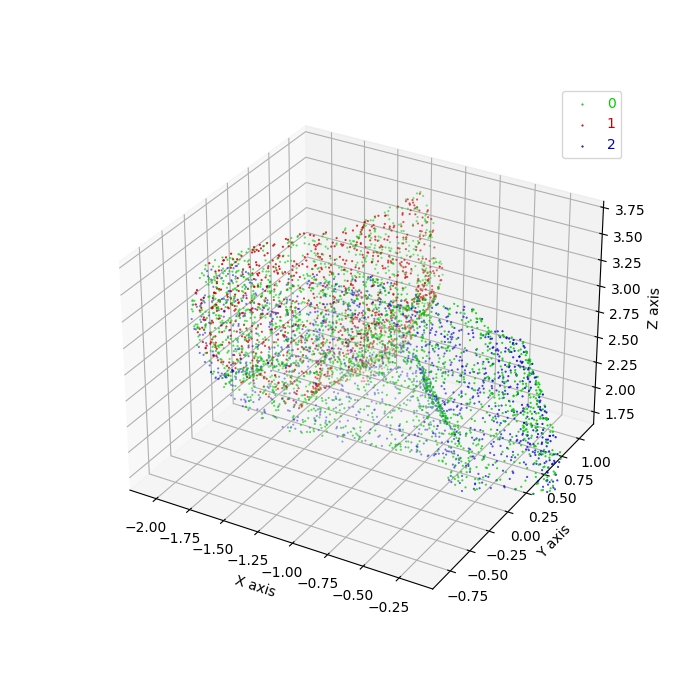

1111  "11" "11" "11"
0000  "tensor[9443, 3] n=28329 (0.1Mb) x∈[-2.439, 2.469] μ=1.549e-08 σ=0.955"
1111  "tensor[4] x∈[-0.398, 0.901] μ=0.180 σ=0.539 [-0.398, 0.050, 0.901, 0.167]"
2222  "tensor[3] x∈[-0.461, 0.910] μ=0.347 σ=0.718 [0.910, 0.592, -0.461]"
0000  "tensor[3034, 3] n=9102 (36Kb) x∈[-1.438, 0.952] μ=-3.458e-09 σ=0.437"
1111  "tensor[4] x∈[-0.302, 0.788] μ=0.310 σ=0.453 [0.342, 0.788, -0.302, 0.413]"
2222  "tensor[3] x∈[-2.269, 0.591] μ=-0.393 σ=1.625 [0.500, 0.591, -2.269]"
0000  "tensor[4681, 3] n=14043 (55Kb) x∈[-1.016, 0.963] μ=-4.625e-08 σ=0.384"
1111  "tensor[4] x∈[0.014, 0.777] μ=0.420 σ=0.313 [0.014, 0.421, 0.777, 0.468]"
2222  "tensor[3] x∈[-0.718, 2.124] μ=0.686 σ=1.422 [-0.718, 0.651, 2.124]"
0000  "tensor[17043, 3] n=51129 (0.2Mb) x∈[-1.803, 2.245] μ=2.268e-08 σ=0.817"
1111  "tensor[4] x∈[-0.645, 0.721] μ=0.108 σ=0.564 [0.721, -0.645, 0.176, 0.181]"
2222  "tensor[3] x∈[0.536, 1.360] μ=0.890 σ=0.424 [0.773, 0.536, 1.360]"
0000  "tensor[8174, 3] n=24522 (96Kb) x∈[-

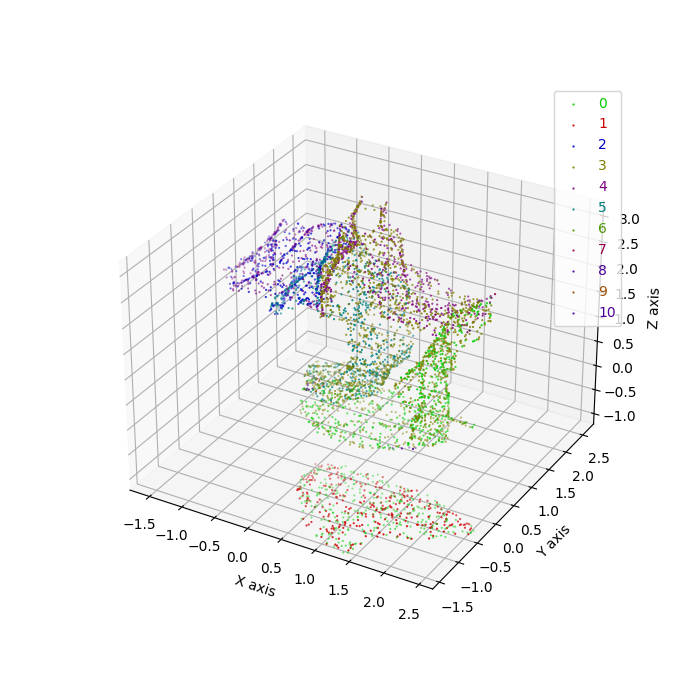

In [8]:
for i, data in enumerate(train_data):
    # if i == 0:
    #     continue
    if i == 2:
        break
    broken_pcs = data['broken_pcs']
    quat = data['quat']
    trans = data['trans']

    broken_pcs_registered = []
    import jhutil; jhutil.jhprint(1111, len(broken_pcs), len(quat), len(trans))

    for bp, q, t in zip(broken_pcs, quat, trans):
        q = torch.Tensor(q)
        t = torch.Tensor(t)
        
        import jhutil; jhutil.jhprint(0000, bp)
        import jhutil; jhutil.jhprint(1111, q)
        import jhutil; jhutil.jhprint(2222, t)
        bp_registed = quat_trans_transform(q, t, bp)
        broken_pcs_registered.append(bp_registed)
        # show_point_clouds([broken_pcs_registered[0], broken_pcs_registered[4]])
    show_point_clouds(broken_pcs_registered, subsample_ratio=0.1)
    # show_meshes(data['dir_name'])

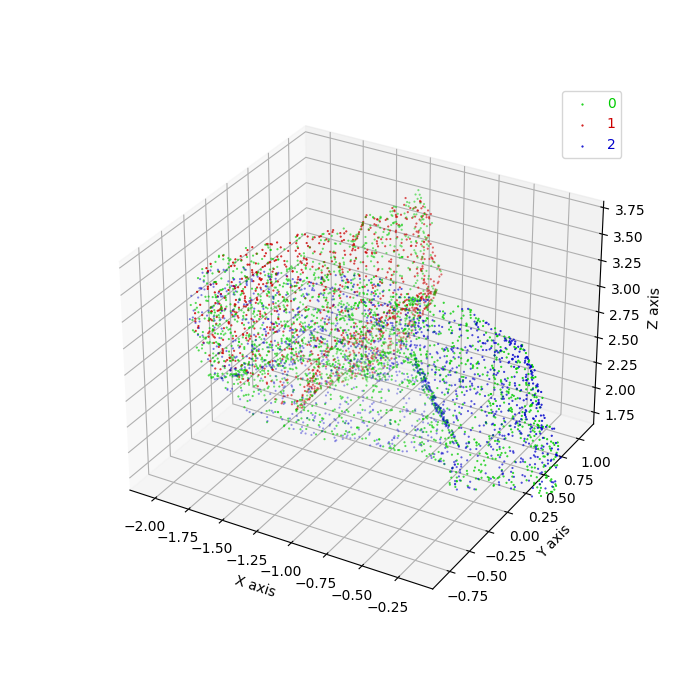

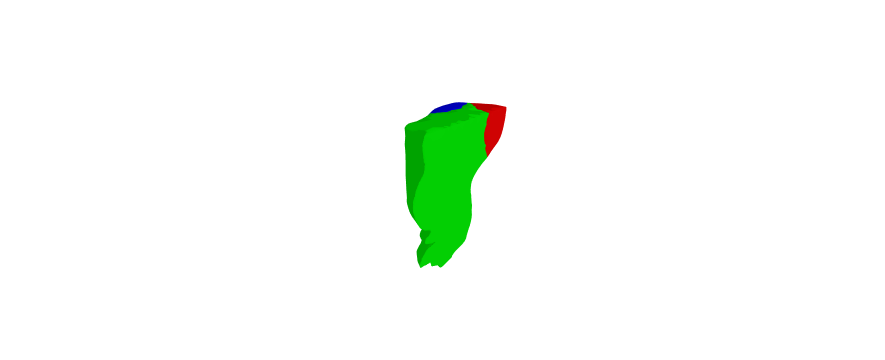

0000 
[
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/mode_5/piece_0.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/mode_5/piece_1.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/mode_5/piece_2.obj"
]
1111  "tensor[3, 3] n=9 x∈[-1.000, 0.997] μ=5.433e-09 σ=0.829 [[-1.000, 0.435, 0.565], [0.996, -1.000, 0.004], [0.997, 0.003, -1.000]]"


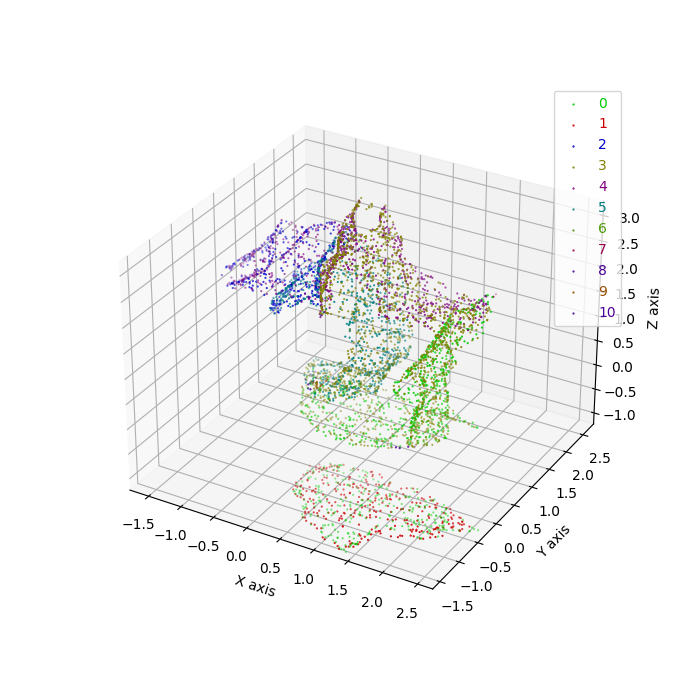

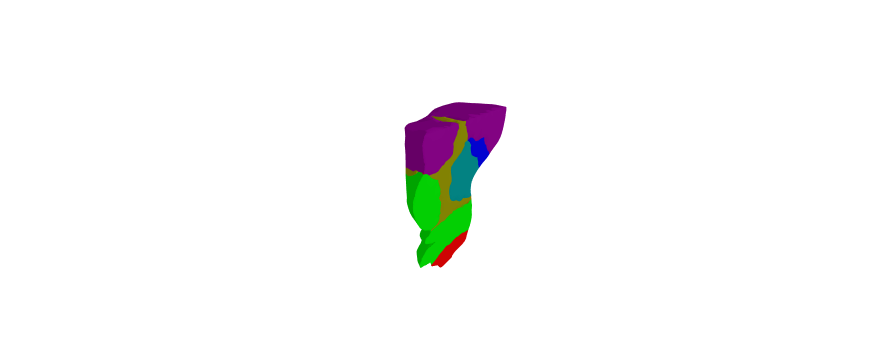

0000 
[
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_0.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_1.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_2.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_3.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_4.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_5.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_6.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_7.obj",
    "/data/wlsgur4011/DataCollection/BreakingBad/data_split/artifact/73400_sf/fractured_45/piece_8.obj",
    "/data/wlsgur4011/DataCollection/BreakingBa

In [12]:
from jhutil import show_meshes

for i, data in enumerate(train_data):
    # if i == 0:
    #     continue
    if i == 2:
        break
    broken_pcs = data['broken_pcs']
    quat = data['quat']
    trans = data['trans']
    dir_name = data['dir_name']
    overlap_ratios = data['overlap_ratios']
    broken_pcs_registered = []
    
    for bp, q, t in zip(broken_pcs, quat, trans):
        q = torch.Tensor(q)
        t = torch.Tensor(t)
        
        # import jhutil; jhutil.jhprint(0000, bp)
        # import jhutil; jhutil.jhprint(1111, q)
        # import jhutil; jhutil.jhprint(2222, t)
        bp_registed = quat_trans_transform(q, t, bp)
        broken_pcs_registered.append(bp_registed)
        # show_point_clouds([broken_pcs_registered[0], broken_pcs_registered[4]])
    show_point_clouds(broken_pcs_registered, subsample_ratio=0.1)
    show_meshes(dir_name)
    
    import jhutil; jhutil.jhprint(1111, overlap_ratios)
    # show_meshes(data['dir_name'])